In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

from datetime import timedelta, datetime
#import holidays

import matplotlib
import pickle
import seaborn as sns

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objs as go

matplotlib.pyplot.style.use('ggplot')
%matplotlib inline

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.6f' % x)
pd.set_option('display.width', 500)

In [2]:
df_wealthy = pd.read_csv('../../../data/train_economic_class/df_wealthy.csv')

In [3]:
df_wealthy.shape

(35752, 29)

In [4]:
df_wealthy['target_class'] = np.where(round(df_wealthy['log_TARGET'], 1) <= -29.9, 1, 0) # class 1 means TARGET is 0.0 

In [5]:
df_wealthy_reg = df_wealthy[df_wealthy['target_class'] == 0]

In [6]:
df_wealthy_reg.shape

(9300, 30)

In [7]:
df_wealthy_reg.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9300 entries, 1 to 35751
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      9300 non-null   int64  
 1   TARGET                  9300 non-null   float64
 2   open_year               9300 non-null   int64  
 3   open_month              9300 non-null   int64  
 4   first_prediction        9300 non-null   float64
 5   log_first_prediction    9300 non-null   float64
 6   economic_class          9300 non-null   object 
 7   log_TARGET              9300 non-null   float64
 8   Retention_count_D0_3    9300 non-null   int64  
 9   Retention_count_D4_7    9300 non-null   int64  
 10  Retention_count_D8_11   9300 non-null   int64  
 11  Retention_count_D12_15  9300 non-null   int64  
 12  Avg_Lvl_Count_D0_3      9300 non-null   float64
 13  Avg_Lvl_Count_D4_7      9300 non-null   float64
 14  Avg_Lvl_Count_D8_11     9300 non-null   floa

In [8]:
df_wealthy_reg.describe()

,ID,TARGET,open_year,open_month,first_prediction,log_first_prediction,log_TARGET,Retention_count_D0_3,Retention_count_D4_7,Retention_count_D8_11,Retention_count_D12_15,Avg_Lvl_Count_D0_3,Avg_Lvl_Count_D4_7,Avg_Lvl_Count_D8_11,Avg_Lvl_Count_D12_15,Avg_Duration_Lvl0_3,Avg_Duration_Lvl4_7,Avg_Duration_Lvl8_10,Total_AdRevenueD0_3,Total_AdRevenueD4_7,Total_AdRevenueD8_11,Total_AdRevenueD12_15,Total_IAPRevenueD0_3,Total_IAPRevenueD4_7,Total_IAPRevenueD8_11,Total_IAPRevenueD12_15,Total_AdRevenue,Total_IAPRevenue,target_class
count,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000,9300.000000
mean,443717.770430,3.630603,2024.000000,2.988495,305.714909,5.575195,-0.545570,2.163548,1.077097,0.889462,0.786022,7.588145,2.783145,2.199274,1.843065,42.408566,86.995484,84.359427,2.326040,0.874628,0.674194,0.547046,0.034791,0.011248,0.007336,0.007615,4.421908,0.060990,0.000000
std,253747.606094,12.595817,0.000000,1.294548,242.415710,0.482778,2.230260,1.090104,1.301175,1.235405,1.177092,10.624391,7.962816,7.496220,6.923012,65.295531,127.327605,131.782725,3.949052,2.458895,2.425590,2.140597,0.334267,0.184072,0.140015,0.142588,8.808490,0.518654,0.000000
min,71.000000,0.000000,2024.000000,1.000000,156.032100,5.050062,-29.821077,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,222887.500000,0.198427,2024.000000,2.000000,178.420793,5.184145,-1.617335,1.000000,0.000000,0.000000,0.000000,2.500000,0.000000,0.000000,0.000000,18.333333,32.500000,39.333333,0.249000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.549963,0.000000,0.000000
50%,442547.500000,0.670075,2024.000000,3.000000,228.494808,5.431513,-0.400365,2.000000,1.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.000000,26.666667,52.750000,61.000000,1.062490,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.823029,0.000000,0.000000
75%,664075.500000,2.295147,2024.000000,4.000000,347.017072,5.849374,0.830797,3.000000,2.000000,1.000000,1.000000,8.250000,2.000000,1.250000,0.750000,45.666667,102.000000,100.000000,2.782757,0.727204,0.405417,0.274998,0.000000,0.000000,0.000000,0.000000,4.847793,0.000000,0.000000
max,878581.000000,386.494019,2024.000000,5.000000,4876.056671,8.492092,5.957116,4.000000,4.000000,4.000000,4.000000,204.750000,260.250000,296.250000,235.250000,2699.333333,3541.500000,4979.666667,71.401290,52.143521,85.259599,101.214085,7.780500,6.500000,5.193500,5.200000,295.808025,10.387000,0.000000


In [9]:
X_cols = [col for col in df_wealthy_reg.columns if col not in ['ID', 'open_year', 'open_month', 'economic_class', 'target_class',
                                                           'first_prediction', 'TARGET']]

In [10]:
df_wealthy_reg.log_TARGET.describe()

count   9300.000000
mean      -0.545570
std        2.230260
min      -29.821077
25%       -1.617335
50%       -0.400365
75%        0.830797
max        5.957116
Name: log_TARGET, dtype: float64

<Axes: >

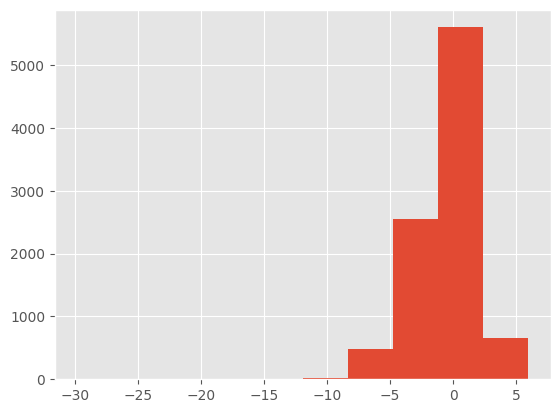

In [11]:
df_wealthy_reg.log_TARGET.hist()

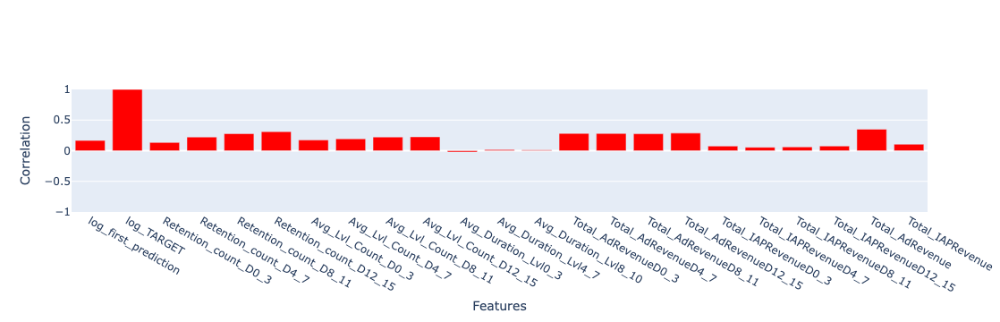

In [12]:
target_corr = df_wealthy_reg[X_cols].corr()['log_TARGET']

fig = go.Figure([go.Bar(y = target_corr, x = target_corr.index, marker_color = 'red')])

fig.update_layout(xaxis_title = "Features", yaxis_title = "Correlation",
    yaxis = dict(
        range=(-1, 1),
        showticklabels=True
    ))
fig.show()

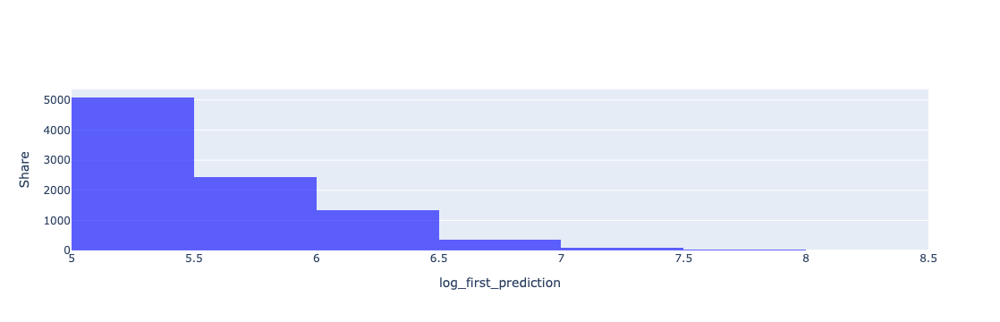

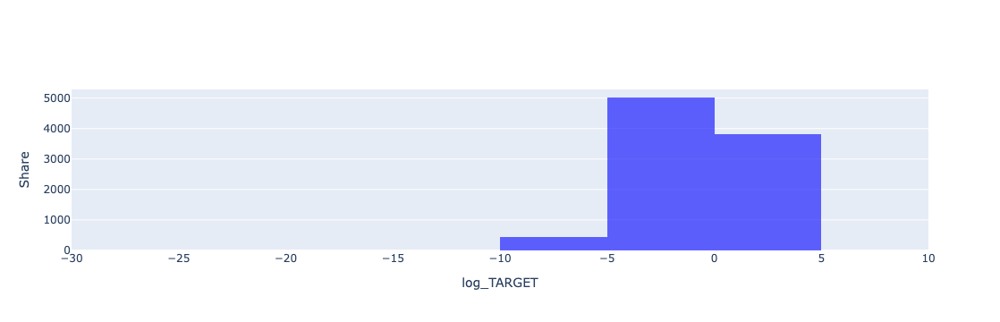

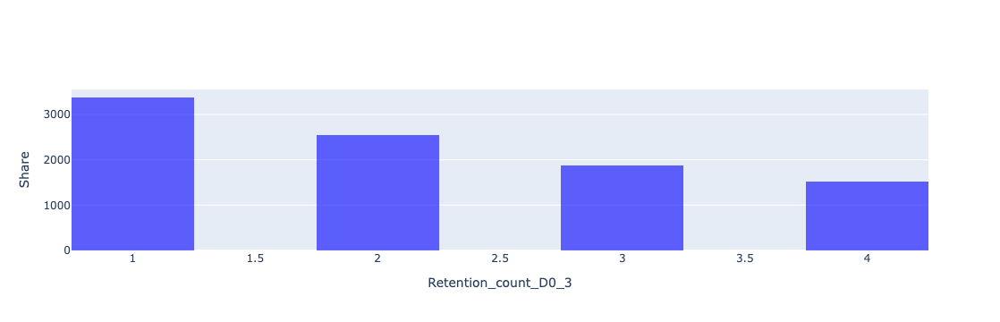

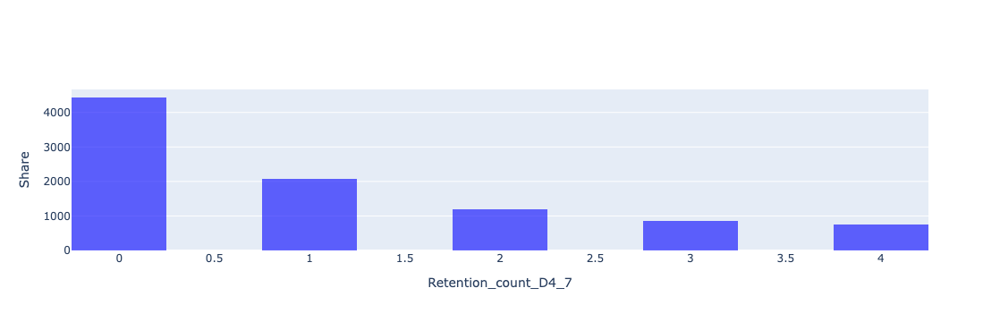

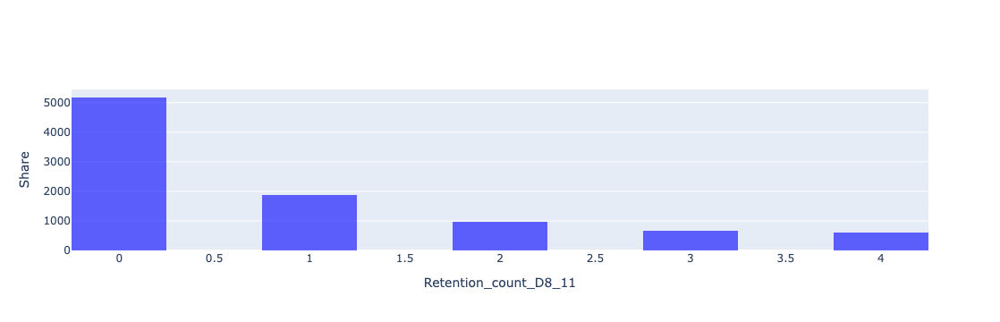

...

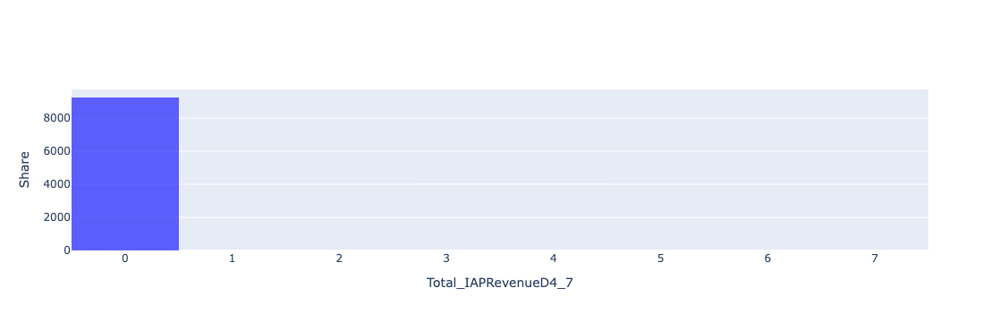

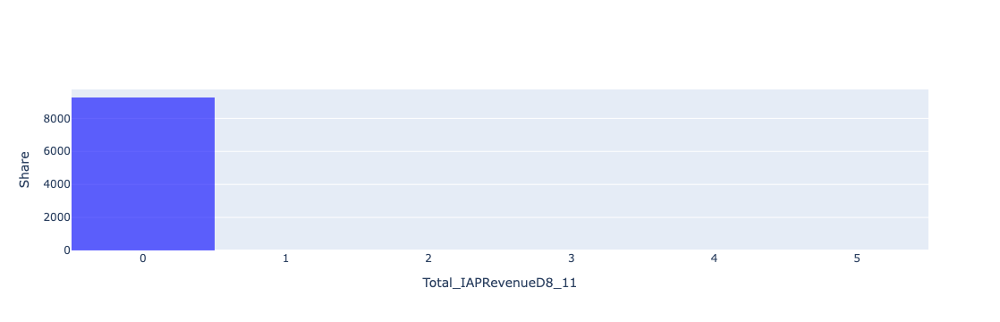

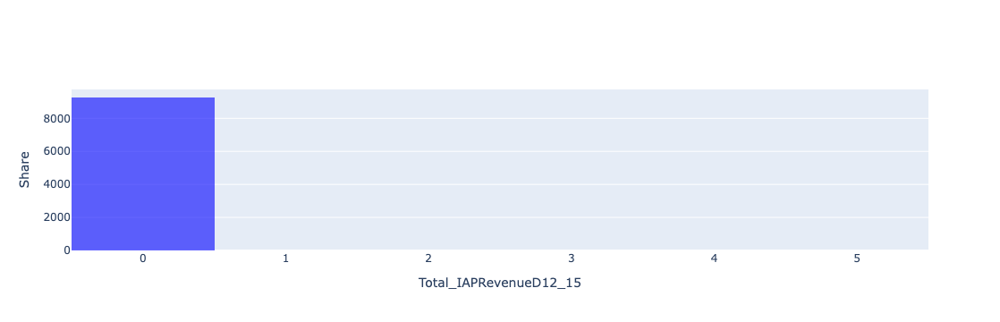

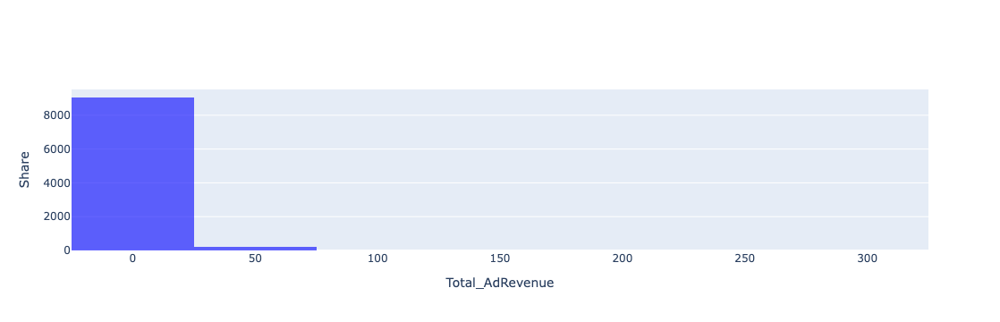

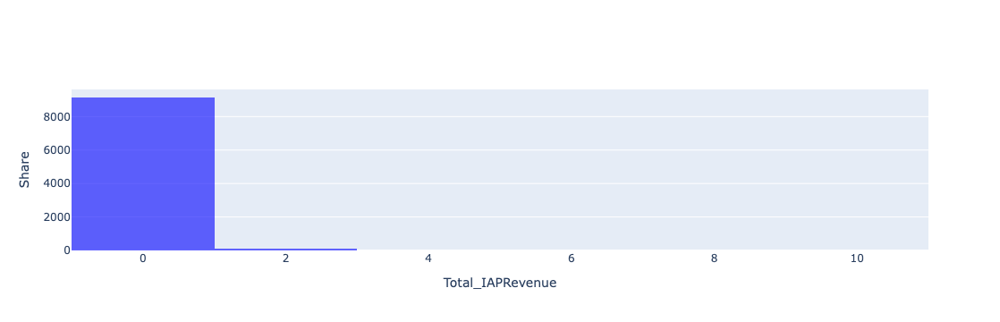

In [13]:
for feature in X_cols:

    fig = go.Figure()
    fig.add_trace(go.Histogram(x = df_wealthy_reg[feature],
                 marker_color = 'blue', opacity = 0.6, nbinsx = 10))


    fig.update_layout(
        legend = dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
        ),
        xaxis_title = feature,
        yaxis_title = "Share"
    )
    fig.show()

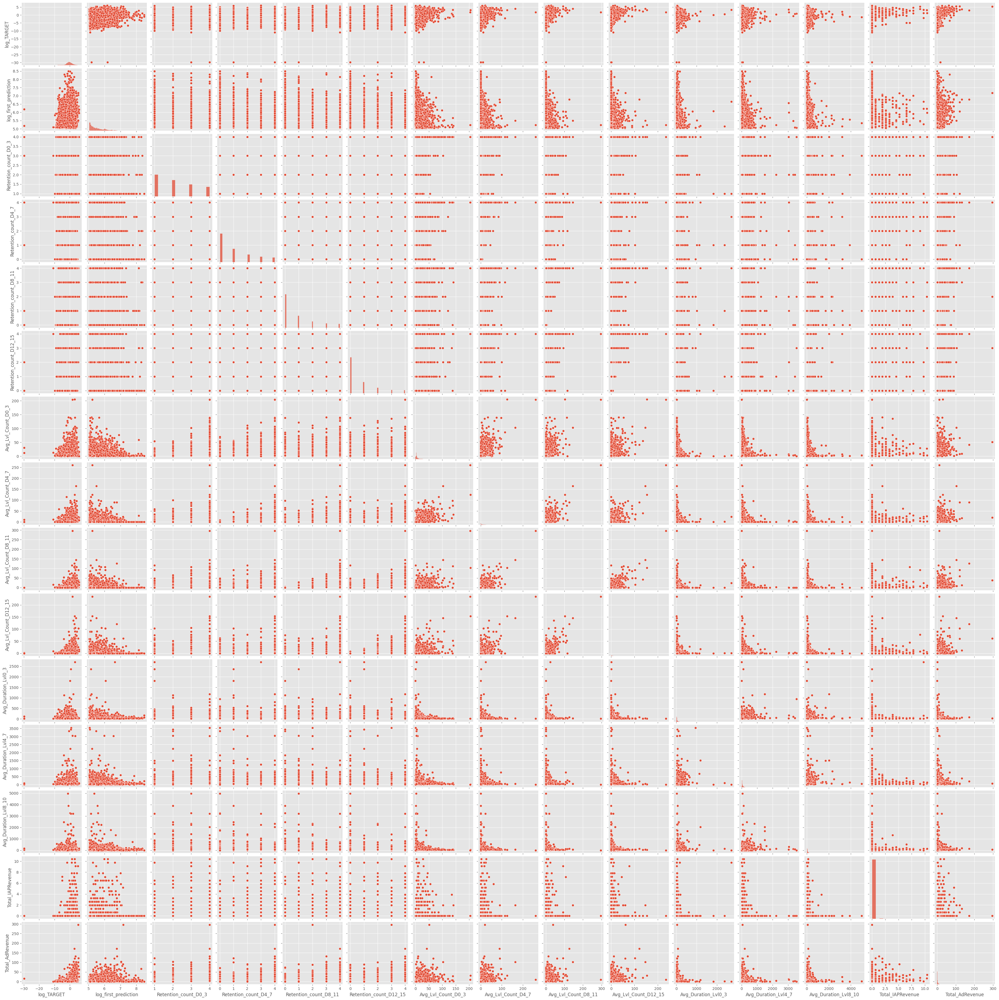

In [14]:
sns.pairplot(df_wealthy_reg.loc[:,['log_TARGET', 
                                'log_first_prediction',
                    'Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
                      'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
                     'Avg_Duration_Lvl0_3',	'Avg_Duration_Lvl4_7',	'Avg_Duration_Lvl8_10',
                       'Total_IAPRevenue', 'Total_AdRevenue']])

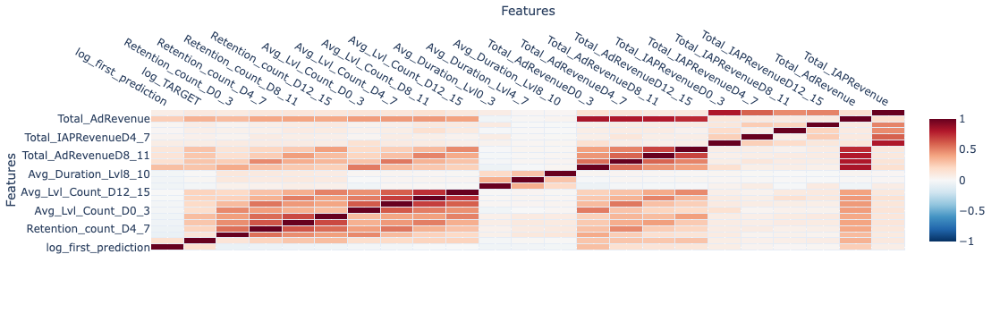

In [15]:
correlation_matrix = df_wealthy_reg[X_cols].corr()

fig = go.Figure(data=go.Heatmap(
                   z = correlation_matrix,
                   x = correlation_matrix.columns,
                   y = correlation_matrix.index,
                   hoverongaps = False,
                   xgap = 1,
                   ygap = 1,
                   zmin = -1,
                   zmax = 1,
    colorscale = 'rdbu_r'
))

fig.update_xaxes(side="top")
fig.update_layout(xaxis_title = "Features", yaxis_title = "Features")
fig.show()

**Model**

In [16]:
X_cols = ['log_first_prediction',
          'Retention_count_D0_3', 'Retention_count_D4_7', 'Retention_count_D8_11', 'Retention_count_D12_15',
          'Avg_Lvl_Count_D0_3', 'Avg_Lvl_Count_D4_7', 'Avg_Lvl_Count_D8_11', 'Avg_Lvl_Count_D12_15',
          'Avg_Duration_Lvl0_3',	'Avg_Duration_Lvl4_7',	'Avg_Duration_Lvl8_10',
          'Total_IAPRevenue', 'Total_AdRevenue']

In [17]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

In [18]:
model = RandomForestRegressor(n_estimators=100, random_state=42)

In [19]:
scaler = MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(df_wealthy_reg[X_cols]), columns=df_wealthy_reg[X_cols].columns)

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, df_wealthy_reg.log_TARGET, test_size=0.2, random_state=42)

In [21]:
model.fit(X_train, y_train)

train_predictions = model.predict(X_train)
test_predictions = model.predict(X_test)

rmse_test = np.sqrt(mean_squared_error(y_test, test_predictions))
rmse_train = np.sqrt(mean_squared_error(y_train, train_predictions))

In [26]:
print(rmse_test)
print(rmse_train)

1.9691215453011375
0.7517142104018492


In [27]:
importances = model.feature_importances_

feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

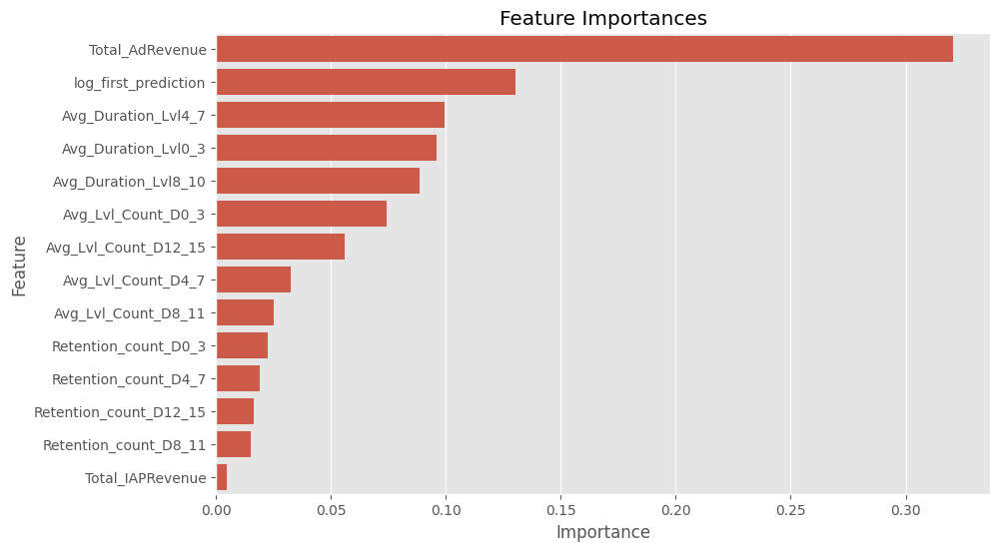

In [28]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

In [29]:
with open('../../../models/wealthy_regressor.pkl', 'wb') as file:
    pickle.dump(model, file)